# EfficientDet 실습

## 1. 라이브러리 설치 및 환경 설정

In [ ]:
!git clone https://github.com/zylo117/Yet-Another-EfficientDet-Pytorch.git
# !pip install opencv-python matplotlib pycocotools

Cloning into 'Yet-Another-EfficientDet-Pytorch'...
remote: Enumerating objects: 765, done.
remote: Total 765 (delta 0), reused 0 (delta 0), pack-reused 765 (from 1)
Receiving objects: 100% (765/765), 8.86 MiB | 20.34 MiB/s, done.
Resolving deltas: 100% (429/429), done.


In [ ]:
import os

os.chdir('Yet-Another-EfficientDet-Pytorch')
print("현재 디렉토리:", os.getcwd())

현재 디렉토리: /content/Yet-Another-EfficientDet-Pytorch


In [ ]:
!mkdir -p weights
!wget https://github.com/zylo117/Yet-Another-Efficient-Pytorch/releases/download/1.0/efficientdet-d0.pth -O weights/efficientdet-d0.pth

--2026-09-10 07:10:16--  https://github.com/zylo117/Yet-Another-Efficient-Pytorch/releases/download/1.0/efficientdet-d0.pth
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/zylo117/Yet-Another-EfficientDet-Pytorch/releases/download/1.0/efficientdet-d0.pth [following]
--2026-09-10 07:10:16--  https://github.com/zylo117/Yet-Another-EfficientDet-Pytorch/releases/download/1.0/efficientdet-d0.pth
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/253385242/9b9d2100-791d-11ea-80b2-d35899cf95fe?sp=r&sv=2018-11-09&sr=b&spr=https&se=2026-09-10T08%3A00%3A08Z&rscd=attachment%3B+filename%3Defficientdet-d0.pth&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-4

In [ ]:
import torch
from backbone import EfficientDetBackbone
compound_coef = 0
model = EfficientDetBackbone(compound_coef=0, num_classes=90)

In [ ]:
model.load_state_dict(torch.load(f'weights/efficientdet-d0.pth', map_location='cpu'))
model.requires_grad_(False)
model.eval()

EfficientDetBackbone(
  (bifpn): Sequential(
    (0): BiFPN(
      (conv6_up): SeparableConvBlock(
        (depthwise_conv): Conv2dStaticSamePadding(
          (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), groups=64, bias=False)
        )
        (pointwise_conv): Conv2dStaticSamePadding(
          (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
        )
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      )
      (conv5_up): SeparableConvBlock(
        (depthwise_conv): Conv2dStaticSamePadding(
          (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), groups=64, bias=False)
        )
        (pointwise_conv): Conv2dStaticSamePadding(
          (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
        )
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      )
      (conv4_up): SeparableConvBlock(
        (depthwise_conv): Conv2dStaticSamePadding(
      

In [ ]:
compound_coef = 0
force_input_size = None  # set None to use default size
# img_path = 'bus.jpg'

# replace this part with your project's anchor config
anchor_ratios = [(1.0, 1.0), (1.4, 0.7), (0.7, 1.4)]
anchor_scales = [2 ** 0, 2 ** (1.0 / 3.0), 2 ** (2.0 / 3.0)]

threshold = 0.2
iou_threshold = 0.2

use_cuda = True
use_float16 = False


In [ ]:
obj_list = ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light',
            'fire hydrant', '', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep',
            'cow', 'elephant', 'bear', 'zebra', 'giraffe', '', 'backpack', 'umbrella', '', '', 'handbag', 'tie',
            'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
            'skateboard', 'surfboard', 'tennis racket', 'bottle', '', 'wine glass', 'cup', 'fork', 'knife', 'spoon',
            'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut',
            'cake', 'chair', 'couch', 'potted plant', 'bed', '', 'dining table', '', '', 'toilet', '', 'tv',
            'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink',
            'refrigerator', '', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
            'toothbrush']

In [ ]:
len(obj_list)

90

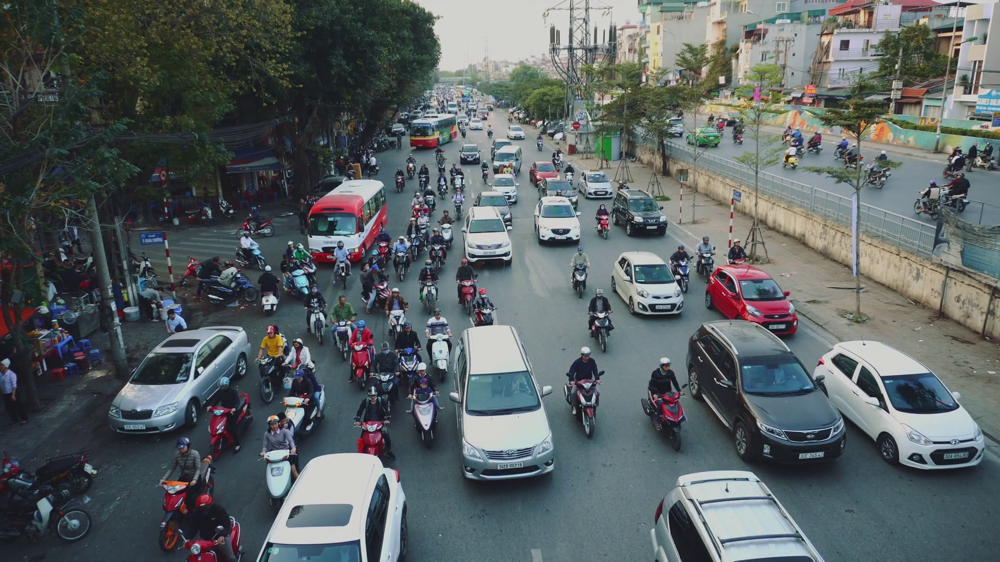

In [ ]:
from PIL import Image
Image.open('test/img.png')

In [ ]:
from utils.utils import preprocess, invert_affine, postprocess, STANDARD_COLORS, standard_to_bgr, get_index_label, plot_one_box

img_path = 'test/img.png'
color_list = standard_to_bgr(STANDARD_COLORS)
input_sizes = [512, 640, 768, 896, 1024, 1280, 1280, 1536, 1536]
input_size = input_sizes[compound_coef] if force_input_size is None else force_input_size
ori_imgs, framed_imgs, framed_metas = preprocess(img_path, max_size=input_size)
if use_cuda:
    x = torch.stack([torch.from_numpy(fi).cuda() for fi in framed_imgs], 0)
else:
    x = torch.stack([torch.from_numpy(fi) for fi in framed_imgs], 0)
x = x.to(torch.float32 if not use_float16 else torch.float16).permute(0, 3, 1, 2)

In [ ]:
ori_imgs[0].shape, framed_imgs[0].shape

((1080, 1920, 3), (512, 512, 3))

In [ ]:
framed_metas

[(512, 288, 1920, 1080, 0, 224)]

In [ ]:
if use_cuda:
    model = model.cuda()
if use_float16:
    model = model.half()
with torch.no_grad():
    features, regression, classification, anchors = model(x)

In [ ]:
features[0].shape, regression[0].shape, classification.shape, anchors.shape

(torch.Size([1, 64, 64, 64]),
 torch.Size([49104, 4]),
 torch.Size([1, 49104, 90]),
 torch.Size([1, 49104, 4]))

In [ ]:
len(features)

5

In [ ]:
features[0].shape, features[1].shape, features[2].shape, features[3].shape, features[4].shape

(torch.Size([1, 64, 64, 64]),
 torch.Size([1, 64, 32, 32]),
 torch.Size([1, 64, 16, 16]),
 torch.Size([1, 64, 8, 8]),
 torch.Size([1, 64, 4, 4]))

In [ ]:
from utils.utils import postprocess
from efficientdet.utils import BBoxTransform, ClipBoxes

with torch.no_grad():
    features, regression, classification, anchors = model(x)
    regressBoxes = BBoxTransform() # 모델이 예측한 regression 값을 실제 bounding box 좌표로 변환
    clipBoxes = ClipBoxes()        # 모델이 예측한 object의 box가 이미지 범위를 벗어나지 않도록 조정
    out = postprocess(x,
                      anchors, regression, classification,
                      regressBoxes, clipBoxes,
                      threshold, iou_threshold)


In [ ]:
out

[{'rois': array([[333.90854   , 239.91882   , 424.3854    , 287.47577   ],
         [314.5766    , 129.69444   , 351.32953   , 163.35027   ],
         [350.1861    , 165.45123   , 433.3695    , 241.53812   ],
         [130.68173   , 232.13904   , 207.67441   , 287.58868   ],
         [362.0021    , 135.14642   , 408.66135   , 169.6908    ],
         [ 56.52711   , 167.49118   , 129.53185   , 224.72946   ],
         [414.87576   , 173.1823    , 506.79477   , 242.5576    ],
         [  0.8863888 , 233.43379   ,  48.700577  , 277.26804   ],
         [ 80.504974  , 246.79994   , 122.74979   , 286.69684   ],
         [232.99295   , 165.08078   , 285.2722    , 247.46469   ],
         [155.38026   ,  93.80188   , 196.91176   , 136.37054   ],
         [330.41702   , 184.25446   , 351.00174   , 229.17694   ],
         [290.06638   , 180.93594   , 309.02835   , 222.59875   ],
         [236.92749   , 112.801186  , 263.35803   , 136.6008    ],
         [316.67487   ,  98.806     , 343.58368   , 12

In [ ]:
out[0]['rois'].shape, out[0]['class_ids'].shape, out[0]['scores'].shape

((37, 4), (37,), (37,))

In [ ]:
import cv2
def display(preds, imgs, imshow=True, imwrite=False):
    for i in range(len(imgs)):
        if len(preds[i]['rois']) == 0:
            continue

        imgs[i] = imgs[i].copy()

        for j in range(len(preds[i]['rois'])):
            x1, y1, x2, y2 = preds[i]['rois'][j].astype(np.int32)
            obj = obj_list[preds[i]['class_ids'][j]]
            score = float(preds[i]['scores'][j])
            plot_one_box(imgs[i], [x1, y1, x2, y2], label=obj,score=score,color=color_list[get_index_label(obj, obj_list)])


        if imshow:
            cv2.imshow('img', imgs[i])
            cv2.waitKey(0)

        if imwrite:
            cv2.imwrite(f'test/img_inferred_d{compound_coef}_this_repo_{i}.jpg', imgs[i])

    return f'test/img_inferred_d{compound_coef}_this_repo_'



In [ ]:
import numpy as np
out = invert_affine(framed_metas, out)
img_path = display(out, ori_imgs, imshow=False, imwrite=True)

In [ ]:
img_path

'test/img_inferred_d0_this_repo_'

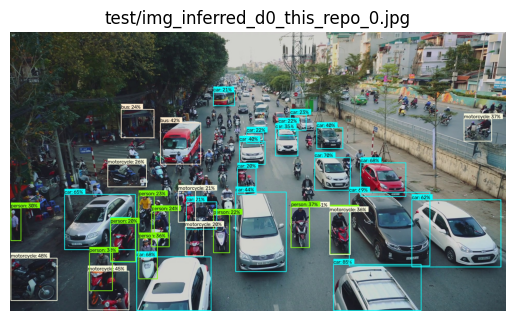

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

img_path = f"{img_path}0.jpg"  # 파일 확장자에 따라 수정 가능

img = Image.open(img_path)

# 이미지 출력
plt.imshow(img)
plt.axis('off')  # 축 제거
plt.title(img_path)
plt.show()

### 영상 분석

In [ ]:
!pwd

/content/Yet-Another-EfficientDet-Pytorch


In [ ]:
os.path.exists('soccer.mp4')

True

In [ ]:
# Core Author: Zylo117
# Script's Author: winter2897

"""
Simple Inference Script of EfficientDet-Pytorch for detecting objects on webcam
"""
import time
import torch
import cv2
import numpy as np
from torch.backends import cudnn
from backbone import EfficientDetBackbone
from efficientdet.utils import BBoxTransform, ClipBoxes
from utils.utils import preprocess, invert_affine, postprocess, preprocess_video

# Video's path
video_src = 'soccer.mp4'  # set int to use webcam, set str to read from a video file
# output_dir = './output_soccer_frames'
output_dir = '/content/Yet-Another-EfficientDet-Pytorch/output_soccer_frames'
output_video_path = '/content/Yet-Another-EfficientDet-Pytorch/output_soccer.mp4'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

compound_coef = 0
force_input_size = 512  # set None to use default size

threshold = 0.2
iou_threshold = 0.2

use_cuda = True
use_float16 = False

obj_list = ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light',
            'fire hydrant', '', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep',
            'cow', 'elephant', 'bear', 'zebra', 'giraffe', '', 'backpack', 'umbrella', '', '', 'handbag', 'tie',
            'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
            'skateboard', 'surfboard', 'tennis racket', 'bottle', '', 'wine glass', 'cup', 'fork', 'knife', 'spoon',
            'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut',
            'cake', 'chair', 'couch', 'potted plant', 'bed', '', 'dining table', '', '', 'toilet', '', 'tv',
            'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink',
            'refrigerator', '', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
            'toothbrush']

input_sizes = [512, 640, 768, 896, 1024, 1280, 1280, 1536, 1536]
input_size = input_sizes[compound_coef] if force_input_size is None else force_input_size

# load model
model = EfficientDetBackbone(compound_coef=compound_coef, num_classes=len(obj_list))
model.load_state_dict(torch.load(f'weights/efficientdet-d{compound_coef}.pth'))
model.requires_grad_(False)
model.eval()

EfficientDetBackbone(
  (bifpn): Sequential(
    (0): BiFPN(
      (conv6_up): SeparableConvBlock(
        (depthwise_conv): Conv2dStaticSamePadding(
          (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), groups=64, bias=False)
        )
        (pointwise_conv): Conv2dStaticSamePadding(
          (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
        )
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      )
      (conv5_up): SeparableConvBlock(
        (depthwise_conv): Conv2dStaticSamePadding(
          (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), groups=64, bias=False)
        )
        (pointwise_conv): Conv2dStaticSamePadding(
          (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
        )
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      )
      (conv4_up): SeparableConvBlock(
        (depthwise_conv): Conv2dStaticSamePadding(
      

In [ ]:
if use_cuda:
    model = model.cuda()
if use_float16:
    model = model.half()


In [ ]:
# function for display
def display(preds, imgs):
    for i in range(len(imgs)):
        if len(preds[i]['rois']) == 0:
            return imgs[i]

        for j in range(len(preds[i]['rois'])):
            (x1, y1, x2, y2) = preds[i]['rois'][j].astype(np.int64)
            cv2.rectangle(imgs[i], (x1, y1), (x2, y2), (255, 255, 0), 2)
            obj = obj_list[preds[i]['class_ids'][j]]
            score = float(preds[i]['scores'][j])

            cv2.putText(imgs[i], '{}, {:.3f}'.format(obj, score),
                        (x1, y1 + 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                        (255, 255, 0), 1)

        return imgs[i]
# Box
regressBoxes = BBoxTransform()
clipBoxes = ClipBoxes()


In [ ]:
# Video capture
cap = cv2.VideoCapture(video_src)
frame_idx = 0
while True:
    ret, frame = cap.read()
    if not ret:
        break

    # frame preprocessing
    ori_imgs, framed_imgs, framed_metas = preprocess_video(frame, max_size=input_size)

    if use_cuda:
        x = torch.stack([torch.from_numpy(fi).cuda() for fi in framed_imgs], 0)
    else:
        x = torch.stack([torch.from_numpy(fi) for fi in framed_imgs], 0)

    x = x.to(torch.float32 if not use_float16 else torch.float16).permute(0, 3, 1, 2)

    # model predict
    with torch.no_grad():
        features, regression, classification, anchors = model(x)

        out = postprocess(x,
                        anchors, regression, classification,
                        regressBoxes, clipBoxes,
                        threshold, iou_threshold)

    # result
    out = invert_affine(framed_metas, out)
    img_show = display(out, ori_imgs)

    # show frame by frame
    img_show = display(out, ori_imgs)

    # 프레임 저장
    frame_path = os.path.join(output_dir, f'frame_{frame_idx:05d}.jpg')
    cv2.imwrite(frame_path, img_show)
    frame_idx += 1


cap.release()
# cv2.destroyAllWindows()

In [ ]:
!ls -l

total 298112
-rw-r--r-- 1 root root      3672 Sep 10 07:09 backbone.py
drwxr-xr-x 2 root root      4096 Sep 10 07:09 benchmark
-rw-r--r-- 1 root root      5465 Sep 10 07:09 coco_eval.py
drwxr-xr-x 2 root root      4096 Sep 10 07:11 datasets
drwxr-xr-x 3 root root      4096 Sep 10 07:10 efficientdet
-rw-r--r-- 1 root root      5013 Sep 10 07:09 efficientdet_test.py
-rw-r--r-- 1 root root      4027 Sep 10 07:09 efficientdet_test_videos.py
drwxr-xr-x 3 root root      4096 Sep 10 07:10 efficientnet
-rw-r--r-- 1 root root      7652 Sep 10 07:09 LICENSE
drwxr-xr-x 2 root root     12288 Sep 10 07:12 output_soccer_frames
drwxr-xr-x 2 root root      4096 Sep 10 07:09 projects
drwxr-xr-x 2 root root      4096 Sep 10 07:10 __pycache__
-rw-r--r-- 1 root root     16644 Sep 10 07:09 readme.md
drwxr-xr-x 2 root root      4096 Sep 10 07:09 res
-rw-r--r-- 1 root root 305135616 Sep 10 07:12 soccer.mp4
drwxr-xr-x 2 root root      4096 Sep 10 07:09 test
-rw-r--r-- 1 root root     14442 Sep 10 07:09 train.

In [ ]:
os.listdir(output_dir)[:10]

['frame_00162.jpg',
 'frame_00042.jpg',
 'frame_00114.jpg',
 'frame_00069.jpg',
 'frame_00014.jpg',
 'frame_00239.jpg',
 'frame_00031.jpg',
 'frame_00244.jpg',
 'frame_00126.jpg',
 'frame_00240.jpg']

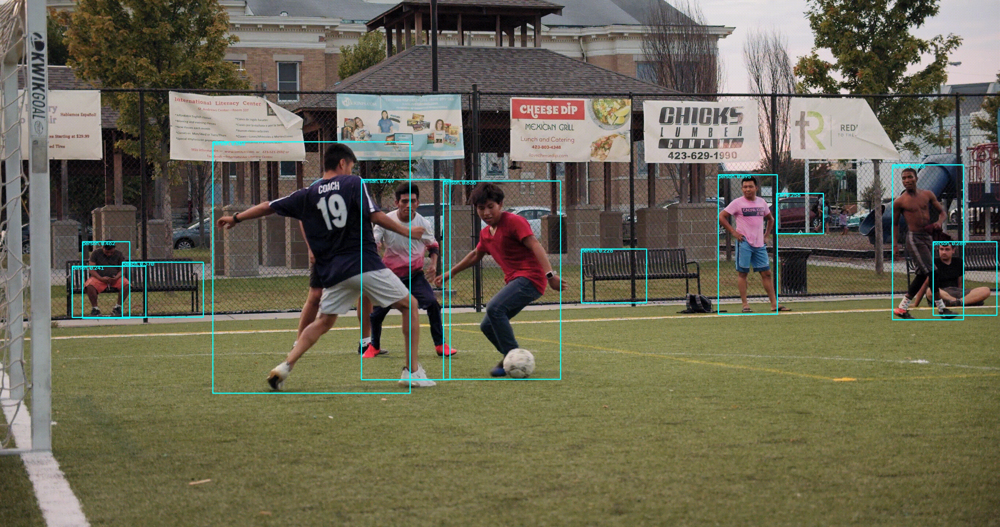

In [ ]:
img = Image.open(os.path.join(output_dir, 'frame_00004.jpg'))
img

In [ ]:
# 🔄 이미지들을 비디오로 합치기
images = sorted([img for img in os.listdir(output_dir) if img.endswith(".jpg")])
first_frame = cv2.imread(os.path.join(output_dir, images[0]))
height, width, _ = first_frame.shape

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out_video = cv2.VideoWriter(output_video_path, fourcc, 20.0, (width, height))  # 20fps

for image_file in images:
    img = cv2.imread(os.path.join(output_dir, image_file))
    out_video.write(img)

out_video.release()
print(f"✅ 영상 생성 완료: {output_video_path}")

✅ 영상 생성 완료: /content/Yet-Another-EfficientDet-Pytorch/output_soccer.mp4


In [ ]:
os.path.exists(output_video_path)

True

### 학습

## Custom dataset 학습 (Car video)
https://www.kaggle.com/datasets/pkdarabi/vehicle-detection-image-dataset

### 1. 데이터셋 준비

- Yet-Another-EfficientDet-Pytorch
    - datasets
        - car_detect
            - Apply_Grayscale
                - Apply_Grayscale
                    - Vehicles_Detection.v9i.coco
                        - test
                            - _annotations.coco.json
                            - XXXX.jpg
                        - train
                        - valid
                

- Yet-Another-EfficientDet-Pytorch
    - projects
        - my_car_detect_proj.yml
    - datasets
        - car_detect
        - my_car_detect_proj
            - annotations
                - instances_train.json
                - instances_valid.json
                - instances_test.json
            - train
                - XXX.jpg
                - XXX.jpg
            - valid
                - XXX.jpg
                - XXX.jpg
            - test
                - XXX.jpg
                - XXX.jpg


### 2. yml 파일 준비

 - projects
     - my_car_detect_proj.yml

![image.png](attachment:image.png)

In [ ]:
import os
import json
import cv2
import matplotlib.pyplot as plt

def show_single_coco_image(
    coco_json_path,
    image_dir,
    image_index=0  # 시각화할 이미지 순서 (0부터 시작)
):
    # Load annotation JSON
    with open(coco_json_path, 'r') as f:
        coco = json.load(f)

    # Map image_id to image metadata
    image_info = coco['images'][image_index]
    image_id = image_info['id']
    file_name = image_info['file_name']
    img_path = os.path.join(image_dir, file_name)

    # Load image
    img = cv2.imread(img_path)
    if img is None:
        print(f"이미지를 불러올 수 없습니다: {img_path}")
        return

    # Index annotations for this image
    anns = [ann for ann in coco['annotations'] if ann['image_id'] == image_id]
    cat_id_to_name = {cat['id']: cat['name'] for cat in coco['categories']}

    # Draw bounding boxes
    for ann in anns:
        x, y, w, h = map(int, ann['bbox'])
        category_id = ann['category_id']
        label = cat_id_to_name.get(category_id, str(category_id))

        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(img, label, (x, y - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    # Convert BGR to RGB for matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Show image
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rgb)
    plt.title(file_name)
    plt.axis('off')
    plt.show()


In [ ]:
!ls -l

total 535132
-rw-r--r-- 1 root root      3672 Sep 10 07:09 backbone.py
drwxr-xr-x 2 root root      4096 Sep 10 07:09 benchmark
-rw-r--r-- 1 root root      5465 Sep 10 07:09 coco_eval.py
drwxr-xr-x 2 root root      4096 Sep 10 07:11 datasets
drwxr-xr-x 3 root root      4096 Sep 10 07:10 efficientdet
-rw-r--r-- 1 root root      5013 Sep 10 07:09 efficientdet_test.py
-rw-r--r-- 1 root root      4027 Sep 10 07:09 efficientdet_test_videos.py
drwxr-xr-x 3 root root      4096 Sep 10 07:10 efficientnet
-rw-r--r-- 1 root root      7652 Sep 10 07:09 LICENSE
drwxr-xr-x 2 root root     12288 Sep 10 07:12 output_soccer_frames
-rw-r--r-- 1 root root 242708359 Sep 10 07:12 output_soccer.mp4
drwxr-xr-x 2 root root      4096 Sep 10 07:09 projects
drwxr-xr-x 2 root root      4096 Sep 10 07:10 __pycache__
-rw-r--r-- 1 root root     16644 Sep 10 07:09 readme.md
drwxr-xr-x 2 root root      4096 Sep 10 07:09 res
-rw-r--r-- 1 root root 305135616 Sep 10 07:12 soccer.mp4
drwxr-xr-x 2 root root      4096 Sep 10

In [ ]:
!pwd

/content/Yet-Another-EfficientDet-Pytorch


In [ ]:
!unzip ./datasets/archive.zip -d ./datasets/car_detect

Archive:  ./datasets/archive.zip
  inflating: ./datasets/car_detect/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.coco/test/_annotations.coco.json  
  inflating: ./datasets/car_detect/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.coco/test/frame_0990_jpg.rf.a3223422e734a57442ee34a58d24d4b4.jpg  
  inflating: ./datasets/car_detect/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.coco/test/frame_1004_jpg.rf.a6f441255e54620ea11fb3cf34fc0a97.jpg  
  inflating: ./datasets/car_detect/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.coco/test/frame_1018_jpg.rf.185b0b25bb53e1d0eb860dda162bb2ae.jpg  
  inflating: ./datasets/car_detect/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.coco/test/frame_1806_jpg.rf.4583992e61114207bd9379b7e0652549.jpg  
  inflating: ./datasets/car_detect/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.coco/test/frame_3837_jpg.rf.7cdff66e6350318c835a7cf1b35525f0.jpg  
  inflating: ./datasets/car_detect/Apply_Grayscale/Apply_

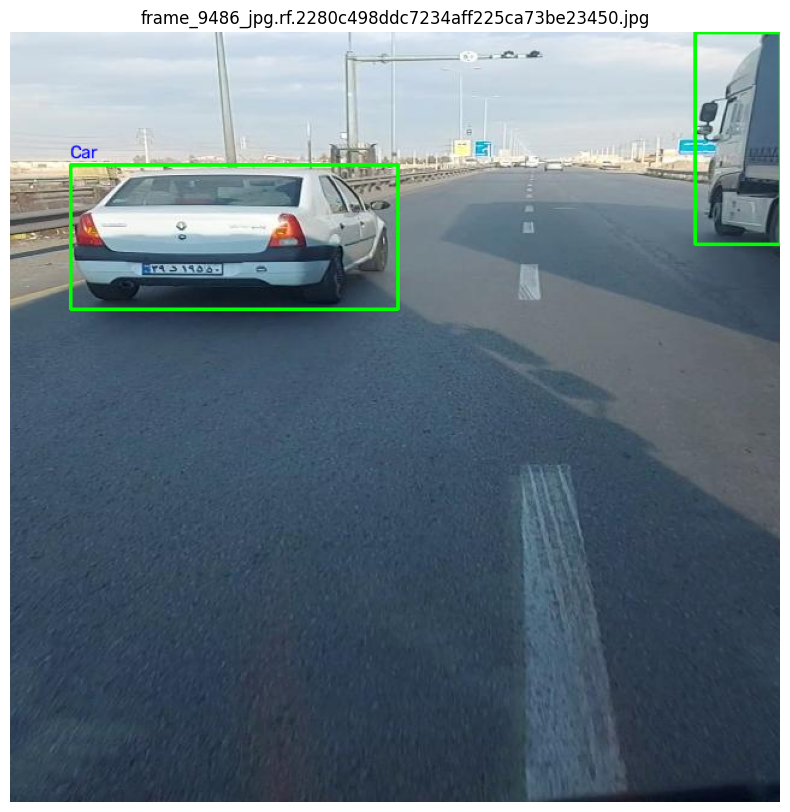

In [ ]:
show_single_coco_image(
    coco_json_path='./datasets/car_detect/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/test/_annotations.coco.json',
    image_dir='./datasets/car_detect/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/test',
    image_index=0  # 첫 번째 이미지 시각화
)


### mean, std, anchor 계산

In [ ]:
import os
import cv2
import numpy as np
from glob import glob
from tqdm import tqdm

def compute_mean_std(image_dir, max_images=None):
    image_paths = sorted(glob(os.path.join(image_dir, '*.jpg')))
    if max_images:
        image_paths = image_paths[:max_images]

    means = []
    stds = []

    for path in tqdm(image_paths, desc="Computing mean/std"):
        img = cv2.imread(path)  # BGR
        if img is None:
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = img / 255.0
        means.append(np.mean(img, axis=(0, 1)))
        stds.append(np.std(img, axis=(0, 1)))

    mean = np.mean(means, axis=0)
    std = np.mean(stds, axis=0)

    print(f"✅ RGB mean: {mean.tolist()}")
    print(f"✅ RGB std : {std.tolist()}")
    return mean.tolist(), std.tolist()

In [ ]:
compute_mean_std('./datasets/car_detect/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/train', max_images=500)  # 샘플 500장 기준

Computing mean/std: 100%|██████████| 102/102 [00:03<00:00, 28.27it/s]

✅ RGB mean: [0.4639068720376132, 0.4723598790503507, 0.4700067273366889]
✅ RGB std : [0.16533415666407805, 0.16423948194385204, 0.16310458962308103]


([0.4639068720376132, 0.4723598790503507, 0.4700067273366889],
 [0.16533415666407805, 0.16423948194385204, 0.16310458962308103])

In [ ]:
import json
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def analyze_bbox_ratios_and_scales(coco_json_path, show_plots=True):

    with open(coco_json_path, 'r') as f:
        coco = json.load(f)

    # 바운딩 박스 정보 추출
    widths, heights, areas = [], [], []
    category_stats = defaultdict(list)  # 카테고리별 통계

    # 카테고리 이름 매핑
    cat_id_to_name = {cat['id']: cat['name'] for cat in coco['categories']}

    for ann in coco['annotations']:
        x, y, w, h = ann['bbox']
        if w > 0 and h > 0:  # 유효한 바운딩 박스만
            widths.append(w)
            heights.append(h)
            areas.append(w * h)

            # 카테고리별 분석을 위해
            cat_name = cat_id_to_name.get(ann['category_id'], 'unknown')
            category_stats[cat_name].append((w, h))

    widths = np.array(widths)
    heights = np.array(heights)
    areas = np.array(areas)

    # 1. Aspect Ratios 계산
    ratios = widths / heights

    # 2. Scales 계산 (면적의 제곱근)
    scales = np.sqrt(areas)

    # 3. 시각화
    if show_plots:
        plt.figure(figsize=(15, 5))

        # Aspect Ratios 히스토그램
        plt.subplot(1, 3, 1)
        plt.hist(ratios, bins=50, alpha=0.7, edgecolor='black')
        plt.axvline(np.median(ratios), color='red', linestyle='--',
                   label=f'Median: {np.median(ratios):.2f}')
        plt.xlabel('Aspect Ratio (W/H)')
        plt.ylabel('Frequency')
        plt.title('Distribution of Aspect Ratios')
        plt.legend()
        plt.grid(True, alpha=0.3)

        # Scales 히스토그램
        plt.subplot(1, 3, 2)
        plt.hist(scales, bins=50, alpha=0.7, edgecolor='black')
        plt.axvline(np.median(scales), color='red', linestyle='--',
                   label=f'Median: {np.median(scales):.1f}')
        plt.xlabel('Scale (sqrt of area)')
        plt.ylabel('Frequency')
        plt.title('Distribution of Scales')
        plt.legend()
        plt.grid(True, alpha=0.3)

        # Log scale로 스케일 분포 확인
        plt.subplot(1, 3, 3)
        plt.hist(np.log(scales), bins=50, alpha=0.7, edgecolor='black')
        plt.xlabel('Log Scale')
        plt.ylabel('Frequency')
        plt.title('Distribution of Log Scales')
        plt.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

    # 4. 통계 정보 출력
    print("📊 데이터셋 통계")
    print(f"총 annotation 수: {len(widths)}")
    print(f"평균 크기: {np.mean(scales):.1f}")
    print(f"중앙값 크기: {np.median(scales):.1f}")
    print(f"평균 비율: {np.mean(ratios):.2f}")
    print(f"중앙값 비율: {np.median(ratios):.2f}")
    print()

    # 5. Anchor Ratios 추천 (20%, 50%, 80% percentile)
    ratio_percentiles = np.percentile(ratios, [20, 50, 80])
    print("🎯 추천 Anchor Ratios")
    print("Percentile 기반 (20%, 50%, 80%):")

    # 단일 값 형태 (EfficientDet/YOLO 스타일)
    ratios_simple = [round(r, 2) for r in ratio_percentiles]
    print(f"  Simple format: {ratios_simple}")

    # Tuple 형태 (일부 구현체용)
    ratios_tuple = [(1.0, round(1/r, 2)) if r > 1 else (round(r, 2), 1.0)
                   for r in ratio_percentiles]
    print(f"  Tuple format: {ratios_tuple}")
    print()

    # 6. Anchor Scales 추천
    scale_percentiles = np.percentile(scales, [20, 50, 80])
    base_scale = scale_percentiles[1]  # 중앙값을 기준으로
    scales_normalized = [round(s / base_scale, 2) for s in scale_percentiles]

    print("📏 추천 Anchor Scales")
    print(f"절대값: {[round(s, 1) for s in scale_percentiles]}")
    print(f"정규화 (중앙값 기준): {scales_normalized}")
    print(f"기준 크기: {base_scale:.1f}")
    print()

    # 7. 실제 사용 예시
    print("💡 실제 설정 예시")
    print("# EfficientDet/RetinaNet 스타일")
    print(f"anchor_ratios = {ratios_simple}")
    print(f"anchor_scales = {scales_normalized}")
    print("")
    print("# 또는 전통적인 설정")
    print("anchor_ratios = [0.5, 1.0, 2.0]")
    print("anchor_scales = [1.0, 1.26, 1.587]  # 2^(0/3), 2^(1/3), 2^(2/3)")
    print()

    # 8. 카테고리별 분석 (상위 5개)
    print("📋 주요 카테고리별 비율 분석")
    cat_ratios = {}
    for cat_name, boxes in category_stats.items():
        if len(boxes) >= 10:  # 충분한 샘플이 있는 카테고리만
            boxes = np.array(boxes)
            cat_ratios[cat_name] = np.median(boxes[:, 0] / boxes[:, 1])

    # 빈도 기준 정렬
    sorted_cats = sorted(cat_ratios.items(),
                        key=lambda x: len(category_stats[x[0]]),
                        reverse=True)[:5]

    for cat_name, median_ratio in sorted_cats:
        count = len(category_stats[cat_name])
        print(f"  {cat_name}: {median_ratio:.2f} (samples: {count})")

    return {
        'ratios_simple': ratios_simple,
        'ratios_tuple': ratios_tuple,
        'scales_normalized': scales_normalized,
        'scales_absolute': [round(s, 1) for s in scale_percentiles],
        'base_scale': base_scale,
        'stats': {
            'total_annotations': len(widths),
            'mean_ratio': np.mean(ratios),
            'median_ratio': np.median(ratios),
            'mean_scale': np.mean(scales),
            'median_scale': np.median(scales)
        }
    }


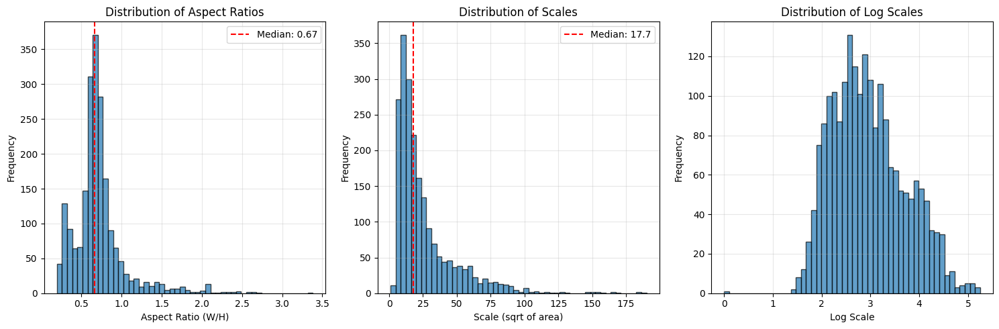

📊 데이터셋 통계
총 annotation 수: 2069
평균 크기: 25.8
중앙값 크기: 17.7
평균 비율: 0.71
중앙값 비율: 0.67

🎯 추천 Anchor Ratios
Percentile 기반 (20%, 50%, 80%):
  Simple format: [np.float64(0.52), np.float64(0.67), np.float64(0.82)]
  Tuple format: [(np.float64(0.52), 1.0), (np.float64(0.67), 1.0), (np.float64(0.82), 1.0)]

📏 추천 Anchor Scales
절대값: [np.float64(9.6), np.float64(17.7), np.float64(37.6)]
정규화 (중앙값 기준): [np.float64(0.54), np.float64(1.0), np.float64(2.13)]
기준 크기: 17.7

💡 실제 설정 예시
# EfficientDet/RetinaNet 스타일
anchor_ratios = [np.float64(0.52), np.float64(0.67), np.float64(0.82)]
anchor_scales = [np.float64(0.54), np.float64(1.0), np.float64(2.13)]

# 또는 전통적인 설정
anchor_ratios = [0.5, 1.0, 2.0]
anchor_scales = [1.0, 1.26, 1.587]  # 2^(0/3), 2^(1/3), 2^(2/3)

📋 주요 카테고리별 비율 분석
  Car: 0.71 (samples: 1527)
  Motorcycle: 0.31 (samples: 281)
  Pickup: 0.56 (samples: 190)
  Truck: 1.45 (samples: 47)
  Bus: 0.36 (samples: 24)


{'ratios_simple': [np.float64(0.52), np.float64(0.67), np.float64(0.82)],
 'ratios_tuple': [(np.float64(0.52), 1.0),
  (np.float64(0.67), 1.0),
  (np.float64(0.82), 1.0)],
 'scales_normalized': [np.float64(0.54), np.float64(1.0), np.float64(2.13)],
 'scales_absolute': [np.float64(9.6), np.float64(17.7), np.float64(37.6)],
 'base_scale': np.float64(17.663521732655695),
 'stats': {'total_annotations': 2069,
  'mean_ratio': np.float64(0.7142181132304681),
  'median_ratio': np.float64(0.6666666666666666),
  'mean_scale': np.float64(25.800453307673692),
  'median_scale': np.float64(17.663521732655695)}}

In [ ]:
analyze_bbox_ratios_and_scales('./datasets/car_detect/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/train/_annotations.coco.json')

In [ ]:
import json

def extract_obj_list(coco_json_path):
    with open(coco_json_path, 'r') as f:
        coco = json.load(f)

    obj_list = [cat['name'] for cat in sorted(coco['categories'], key=lambda x: x['id'])]
    print("obj_list:", obj_list)
    return obj_list


In [ ]:
extract_obj_list('./datasets/car_detect/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/train/_annotations.coco.json')

obj_list: ['cars', 'Bus', 'Car', 'Motorcycle', 'Pickup', 'Truck']


['cars', 'Bus', 'Car', 'Motorcycle', 'Pickup', 'Truck']

- Yet-Another-EfficientDet-Pytorch
    - projects
        - my_car_detect_proj.yml
    - datasets
        - car_detect
        - my_car_detect
            - annotations
                - instances_train.json
                - instances_valid.json
                - instances_test.json
            - train
                - XXX.jpg
                - XXX.jpg
            - valid
                - XXX.jpg
                - XXX.jpg
            - test
                - XXX.jpg
                - XXX.jpg


![image.png](attachment:image.png)

![image.png](attachment:image.png)

![image.png](attachment:image.png)

In [ ]:
import os
import shutil
import json
from pathlib import Path

# 1) 설정: 원본/대상 경로 및 split 정의
SRC_ROOT = Path("datasets/car_detect/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.coco")
DST_ROOT = Path("datasets/my_car_detect_proj")
ANNOT_DIR = DST_ROOT / "annotations"
SPLITS = ["train", "valid", "test"]

# 2) 대상 디렉토리 생성
for p in [DST_ROOT, ANNOT_DIR] + [DST_ROOT / s for s in SPLITS]:
    p.mkdir(parents=True, exist_ok=True)

# 3) split별 이미지 복사 및 annotation 변환·저장
for split in SPLITS:
    src_split = SRC_ROOT / split
    dst_split = DST_ROOT / split
    dst_split.mkdir(exist_ok=True)

    # 3-1) 이미지 파일(.jpg/.png) 복사
    for ext in ("*.jpg", "*.png"):
        for img_path in src_split.glob(ext):
            shutil.copy(img_path, dst_split / img_path.name)

    # 3-2) annotation JSON 변환
    #    - 원본 JSON 불러오기
    #    - COCO to EfficientDet-PyTorch 형식 변환
    #    - instances_{split}.json으로 저장
    for json_path in src_split.glob("*.json"):
        with open(json_path, "r", encoding="utf-8") as f:
            before = json.load(f)

        # 새 구조 준비
        tobe = {
            "images": [],
            "type": "instances",
            "annotations": [],
            "categories": []
        }

        # images 필드
        for img in before.get("images", []):
            tobe["images"].append({
                "file_name": img["file_name"],
                "height": img["height"],
                "width": img["width"],
                "id": img["id"]
            })

        # annotations 필드
        for ann in before.get("annotations", []):
            tobe["annotations"].append({
                "id": ann["id"],
                "image_id": ann["image_id"],
                "category_id": ann["category_id"],
                "bbox": ann["bbox"],
                "area": ann["area"],
                "iscrowd": ann.get("iscrowd", 0),
                "ignore": 0,
                "segmentation": ann.get("segmentation", [])
            })

        # categories 필드
        for cat in before.get("categories", []):
            tobe["categories"].append({
                "supercategory": cat.get("supercategory", ""),
                "id": cat["id"],
                "name": cat["name"]
            })

        # 저장
        dst_json = ANNOT_DIR / f"instances_{split}.json"
        with open(dst_json, "w", encoding="utf-8") as f:
            json.dump(tobe, f, ensure_ascii=False, indent=2)

        print(f"[{split}] {json_path.name} → {dst_json.name}")

print("✅ 전체 폴더 구조 및 annotation 변환 완료!")


[train] _annotations.coco.json → instances_train.json
[valid] _annotations.coco.json → instances_valid.json
[test] _annotations.coco.json → instances_test.json
✅ 전체 폴더 구조 및 annotation 변환 완료!


In [ ]:
import os
import shutil
from pathlib import Path

# 원본 루트 (변경 필요 시 수정)
SRC_ROOT = Path("datasets/car_detect/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.coco")

# 대상 루트
DST_ROOT = Path("datasets/my_car_detect_proj")
ANNOT_DIR = DST_ROOT / "annotations"

# splits 정보
SPLITS = ["train", "valid", "test"]

# annotation 파일 패턴 (원본 디렉토리 안에서 *.json 찾기)
ANNOT_PATTERN = "_annotations.coco.json"  # test에만 있다면 'test'만 복사됩니다.

# 1) 대상 디렉토리 생성
for d in [DST_ROOT, ANNOT_DIR] + [DST_ROOT / s for s in SPLITS]:
    d.mkdir(parents=True, exist_ok=True)

# 2) 이미지 파일 복사 및 annotation 파일 복사
for split in SPLITS:
    src_split = SRC_ROOT / split
    dst_split = DST_ROOT / split

    # 이미지(.jpg/.png) 복사
    for ext in ("*.jpg", "*.png"):
        for img_path in src_split.glob(ext):
            shutil.copy(img_path, dst_split / img_path.name)

    # annotation JSON 복사 (split별로 이름 바꿔 복사)
    # 만약 train/valid 폴더에도 JSON이 있다면 동일 로직으로 처리됩니다.
    for json_path in src_split.glob("*.json"):
        dst_json = ANNOT_DIR / f"instances_{split}.json"
        shutil.copy(json_path, dst_json)
        print(f"Copied annotation for {split}: {json_path.name} → {dst_json.name}")

print("✅ 폴더 구조 변환 완료!")

Copied annotation for train: _annotations.coco.json → instances_train.json
Copied annotation for valid: _annotations.coco.json → instances_valid.json
Copied annotation for test: _annotations.coco.json → instances_test.json
✅ 폴더 구조 변환 완료!


```python

project_name: car_detect_proj  # also the folder name of the dataset that under data_path folder
train_set: train
val_set: valid
num_gpus: 0

# mean and std in RGB order, actually this part should remain unchanged as long as your dataset is similar to coco.
mean: [0.4639068720376132, 0.4723598790503507, 0.4700067273366889]
std: [0.16533415666407805, 0.16423948194385204, 0.16310458962308103]

# this is coco anchors, change it if necessary
anchors_scales: '[0.54, 1.0, 2.13]'
anchors_ratios: '[(0.52, 1.0), (0.67, 1.0), (0.82, 1.0)]'

# must match your dataset's category_id.
# category_id is one_indexed,
# for example, index of 'car' here is 2, while category_id of is 3
obj_list: ['cars', 'Bus', 'Car', 'Motorcycle', 'Pickup', 'Truck']

```

![image-2.png](attachment:image-2.png)

## 학습

- scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, verbose=True)
- 에러 발생 시 => 아래와 같이 수정
- scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3)

In [ ]:
!pip install tensorboardX

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.5/87.5 kB 7.4 MB/s eta 0:00:00


In [ ]:
!pwd

/content/Yet-Another-EfficientDet-Pytorch


In [ ]:
! python train.py -c 0 -p my_car_detect_proj --head_only True --lr 1e-3 --batch_size 16 --load_weights weights/efficientdet-d0.pth  --num_epochs 10 --save_interval 100


loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
[Warning] Ignoring Error(s) in loading state_dict for EfficientDetBackbone:
	size mismatch for classifier.header.pointwise_conv.conv.weight: copying a param with shape torch.Size([810, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([54, 64, 1, 1]).
	size mismatch for classifier.header.pointwise_conv.conv.bias: copying a param with

In [ ]:
! python train.py -c 0 -p my_car_detect_proj --head_only False --lr 1e-3 --batch_size 16 --load_weights './logs/my_car_detect_proj/efficientdet-d0_9_80.pth'  --num_epochs 30 --save_interval 100

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Traceback (most recent call last):
  File "/content/Yet-Another-EfficientDet-Pytorch/train.py", line 326, in <module>
    train(opt)
    ~~~~~^^^^^
  File "/content/Yet-Another-EfficientDet-Pytorch/train.py", line 139, in train
    ret = model.load_state_dict(torch.load(weights_path), strict=False)
                                ~~~~~~~~~~^^^^^^^^^^^^

In [ ]:
%cd logs/my_car_detect_proj
weight_file = !ls -Art | grep efficientdet
weight_file

[Errno 2] No such file or directory: 'logs/my_car_detect_proj'
/content/Yet-Another-EfficientDet-Pytorch


['efficientdet_test_videos.py', 'efficientdet_test.py', 'efficientdet']

In [ ]:
%cd ..
%cd ..

/content
/


In [ ]:
! python coco_eval.py -c 0 -p my_car_detect_proj -w "logs/my_car_detect_proj/{weight_file[-1]}"

running coco-style evaluation on project my_car_detect_proj, weights logs/my_car_detect_proj/efficientdet...
Traceback (most recent call last):
  File "/content/Yet-Another-EfficientDet-Pytorch/coco_eval.py", line 49, in <module>
    params = yaml.safe_load(open(f'projects/{project_name}.yml'))
                            ~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
FileNotFoundError: [Errno 2] No such file or directory: 'projects/my_car_detect_proj.yml'


In [ ]:
os.path.exists('./datasets/car_detect/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/test/frame_0990_jpg.rf.a3223422e734a57442ee34a58d24d4b4.jpg')

In [ ]:
import torch
from torch.backends import cudnn

from backbone import EfficientDetBackbone
import cv2
import matplotlib.pyplot as plt
import numpy as np

from efficientdet.utils import BBoxTransform, ClipBoxes
from utils.utils import preprocess, invert_affine, postprocess

compound_coef = 0
force_input_size = None  # set None to use default size
img_path = './datasets/car_detect/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/test/frame_0990_jpg.rf.a3223422e734a57442ee34a58d24d4b4.jpg'

threshold = 0.4
iou_threshold = 0.2

use_cuda = True
use_float16 = False

obj_list = ['cars', 'Bus', 'Car', 'Motorcycle', 'Pickup', 'Truck']

# tf bilinear interpolation is different from any other's, just make do
input_sizes = [512, 640, 768, 896, 1024, 1280, 1280, 1536]
input_size = input_sizes[compound_coef] if force_input_size is None else force_input_size
ori_imgs, framed_imgs, framed_metas = preprocess(img_path, max_size=input_size)

if use_cuda:
    x = torch.stack([torch.from_numpy(fi).cuda() for fi in framed_imgs], 0)
else:
    x = torch.stack([torch.from_numpy(fi) for fi in framed_imgs], 0)

x = x.to(torch.float32 if not use_float16 else torch.float16).permute(0, 3, 1, 2)

model = EfficientDetBackbone(compound_coef=compound_coef, num_classes=len(obj_list),

                             # replace this part with your project's anchor config
                             ratios=[(1.0, 1.0), (1.3, 0.8), (1.9, 0.5)],
                             scales=[2 ** 0, 2 ** (1.0 / 3.0), 2 ** (2.0 / 3.0)])

model.load_state_dict(torch.load('logs/my_car_detect_proj/'+weight_file[-1]))
model.requires_grad_(False)
model.eval()

if use_cuda:
    model = model.cuda()
if use_float16:
    model = model.half()

with torch.no_grad():
    features, regression, classification, anchors = model(x)

    regressBoxes = BBoxTransform()
    clipBoxes = ClipBoxes()

    out = postprocess(x,
                      anchors, regression, classification,
                      regressBoxes, clipBoxes,
                      threshold, iou_threshold)

out = invert_affine(framed_metas, out)

for i in range(len(ori_imgs)):
    if len(out[i]['rois']) == 0:
        continue
    ori_imgs[i] = ori_imgs[i].copy()
    for j in range(len(out[i]['rois'])):
        (x1, y1, x2, y2) = out[i]['rois'][j].astype(np.int32)
        cv2.rectangle(ori_imgs[i], (x1, y1), (x2, y2), (255, 255, 0), 2)
        obj = obj_list[out[i]['class_ids'][j]]
        score = float(out[i]['scores'][j])

        cv2.putText(ori_imgs[i], '{}, {:.3f}'.format(obj, score),
                    (x1, y1 + 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                    (255, 255, 0), 1)

        plt.imshow(ori_imgs[i])

In [ ]:
out